In [1]:
# Import dependencies

import pandas as pd 

from sklearn.preprocessing import StandardScaler

import numpy as np

import seaborn as sns

import hvplot.pandas
import plotly.express as px
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans




In [2]:
#read the file
file_to_load = "../Resources/beauty_habits_clean.csv"
df=pd.read_csv(file_to_load, usecols=["id", "brand", "name", "category", "rating", "number_of_reviews", "love", "price", "online_only", "exclusive", "limited_edition"])
df

,id,brand,category,name,rating,number_of_reviews,love,price,online_only,exclusive,limited_edition
0,2218774,Acqua Di Parma,Fragrance,Blu Mediterraneo MINIATURE Set,4.0,4,3002,66.0,1,0,0
1,2044816,Acqua Di Parma,Cologne,Colonia,4.5,76,2700,66.0,1,0,0
2,1417567,Acqua Di Parma,Perfume,Arancia di Capri,4.5,26,2600,180.0,1,0,0
3,1417617,Acqua Di Parma,Perfume,Mirto di Panarea,4.5,23,2900,120.0,1,0,0
4,2218766,Acqua Di Parma,Fragrance,Colonia Miniature Set,3.5,2,943,72.0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...
9163,2208502,SEPHORA COLLECTION,Face Masks,The Rose Gold Mask,2.0,15,6200,6.0,0,1,1
9164,2298909,SEPHORA COLLECTION,Lip Sets,Give Me Some Sugar Colorful Gloss Balm Set,0.0,0,266,15.0,0,1,0
9165,2236750,SEPHORA COLLECTION,Tinted Moisturizer,Weekend Warrior Tone Up Cream,0.0,0,445,16.0,0,1,0
9166,50,SEPHORA COLLECTION,no category,Gift Card,5.0,46,0,50.0,0,0,0


In [3]:
df.dtypes

id                     int64
brand                 object
category              object
name                  object
rating               float64
number_of_reviews      int64
love                   int64
price                float64
online_only            int64
exclusive              int64
limited_edition        int64
dtype: object

In [4]:
df.describe()

,id,rating,number_of_reviews,love,price,online_only,exclusive,limited_edition
count,9.168000e+03,9168.000000,9168.000000,9.168000e+03,9168.000000,9168.000000,9168.000000,9168.000000
mean,1.962952e+06,3.990020,282.139180,1.627859e+04,50.063237,0.234839,0.264725,0.091841
std,3.859714e+05,1.007707,890.642028,4.260651e+04,47.164989,0.423921,0.441211,0.288817
min,5.000000e+01,0.000000,0.000000,0.000000e+00,2.000000,0.000000,0.000000,0.000000
25%,1.819453e+06,4.000000,10.000000,1.600000e+03,24.000000,0.000000,0.000000,0.000000
50%,2.072354e+06,4.000000,46.000000,4.800000e+03,35.000000,0.000000,0.000000,0.000000
75%,2.230591e+06,4.500000,210.000000,1.380000e+04,59.000000,0.000000,1.000000,0.000000
max,2.359685e+06,5.000000,19000.000000,1.300000e+06,549.000000,1.000000,1.000000,1.000000


In [5]:
number_df=df.drop(columns=["id","brand", "category", "name"])
number_df

,rating,number_of_reviews,love,price,online_only,exclusive,limited_edition
0,4.0,4,3002,66.0,1,0,0
1,4.5,76,2700,66.0,1,0,0
2,4.5,26,2600,180.0,1,0,0
3,4.5,23,2900,120.0,1,0,0
4,3.5,2,943,72.0,1,0,0
...,...,...,...,...,...,...,...
9163,2.0,15,6200,6.0,0,1,1
9164,0.0,0,266,15.0,0,1,0
9165,0.0,0,445,16.0,0,1,0
9166,5.0,46,0,50.0,0,0,0


In [6]:
number_df = number_df.loc[number_df["love"]<650000]

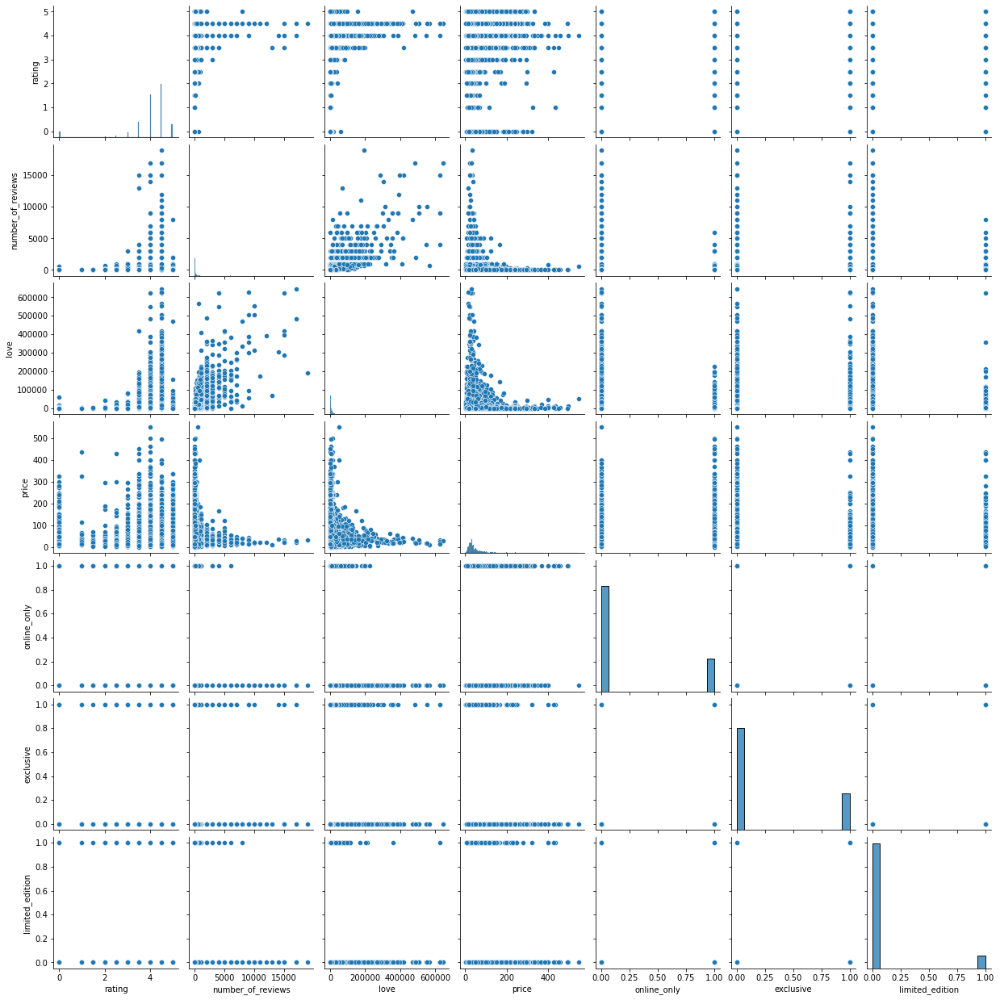

In [7]:
sns.pairplot(number_df)

In [8]:
#X = numbers_df
X=number_df
print(X.shape)
X.head()

(9164, 7)


,rating,number_of_reviews,love,price,online_only,exclusive,limited_edition
0,4.0,4,3002,66.0,1,0,0
1,4.5,76,2700,66.0,1,0,0
2,4.5,26,2600,180.0,1,0,0
3,4.5,23,2900,120.0,1,0,0
4,3.5,2,943,72.0,1,0,0


In [9]:
# Standardize the data with StandardScaler().
X_scaled = StandardScaler().fit_transform(X)
print(X_scaled[0:5])

[[ 0.01012385 -0.31894258 -0.33525193  0.33765419  1.80454605 -0.60003958
  -0.31808427]
 [ 0.50624657 -0.23486699 -0.34309195  0.33765419  1.80454605 -0.60003958
  -0.31808427]
 [ 0.50624657 -0.29325282 -0.34568798  2.75443036  1.80454605 -0.60003958
  -0.31808427]
 [ 0.50624657 -0.29675597 -0.33789988  1.4824429   1.80454605 -0.60003958
  -0.31808427]
 [-0.48599887 -0.32127801 -0.38870426  0.46485293  1.80454605 -0.60003958
  -0.31808427]]


In [10]:
# Feed the data into PCA
# Using PCA to reduce dimension to three principal components.
# Initialise PCA model
pca = PCA(n_components=2, random_state=1)
# Get 3 principal components for the X data
X_pca = pca.fit_transform(X_scaled)
X_pca

array([[-1.00695793,  0.78540454],
       [-0.86288767,  0.93305383],
       [-1.35196838,  2.01472982],
       ...,
       [-0.7542431 , -2.4381189 ],
       [-0.08944266,  0.82033316],
       [-1.07904746, -0.62573081]])

In [11]:
# understand the pca - explained_variance_ratio
pca.explained_variance_ratio_

array([0.26601905, 0.1802746 ])

In [12]:
# Create a DataFrame with the three principal components.
pcs_df = pd.DataFrame(data=X_pca, columns=["PC 1", "PC 2"], index=number_df.index)
print(pcs_df.shape)
pcs_df.head()

(9164, 2)


,PC 1,PC 2
0,-1.006958,0.785405
1,-0.862888,0.933054
2,-1.351968,2.014730
3,-1.112241,1.444090
4,-1.162055,0.698190


In [13]:
# Feed the data into elbow curve to determine the number of clusters K
# Find the best value for K
inertia = []
k = list(range(1, 11))

# Calculate the inertia for the range of K values
for i in k:
    km = KMeans(n_clusters=i, random_state=1000)
    km.fit(pcs_df)
    inertia.append(km.inertia_)

# Create the elbow curve
elbow_data = {"k": k, "inertia": inertia}
df_elbow = pd.DataFrame(elbow_data)
df_elbow.hvplot.line(x="k", y="inertia", xticks=k, title="Elbow Curve")

:Curve   [k]   (inertia)

In [14]:
# Feed the data into KMeans
# Initialize the K-Means model.
model = KMeans(n_clusters=3, random_state=1)

# Fit the model
model.fit(pcs_df)

# Predict clusters
predictions = model.predict(pcs_df)
predictions

array([1, 1, 1, ..., 2, 1, 2], dtype=int32)

In [15]:
# Create a new DataFrame including predicted clusters and model_unsuper_df features.
# Concatentate the model_unsuper_df and pcs_df DataFrames on the same df.
clustered_df = pd.concat([number_df, pcs_df], axis=1)

# Add a column, "state_abb" to the clustered_df DataFrame 
clustered_df["category"] = df["category"]
clustered_df["brand"] = df["brand"]
clustered_df["name"] = df["name"]

#  Add a new column, "Class" to the clustered_df DataFrame that holds the predictions.
clustered_df["Class"] = model.labels_

# Print the shape of the clustered_df
print(clustered_df.shape)
clustered_df.head(10)

(9164, 13)


,rating,number_of_reviews,love,price,online_only,exclusive,limited_edition,PC 1,PC 2,category,brand,name,Class
0,4.0,4,3002,66.0,1,0,0,-1.006958,0.785405,Fragrance,Acqua Di Parma,Blu Mediterraneo MINIATURE Set,1
1,4.5,76,2700,66.0,1,0,0,-0.862888,0.933054,Cologne,Acqua Di Parma,Colonia,1
2,4.5,26,2600,180.0,1,0,0,-1.351968,2.014730,Perfume,Acqua Di Parma,Arancia di Capri,1
3,4.5,23,2900,120.0,1,0,0,-1.112241,1.444090,Perfume,Acqua Di Parma,Mirto di Panarea,1
4,3.5,2,943,72.0,1,0,0,-1.162055,0.698190,Fragrance,Acqua Di Parma,Colonia Miniature Set,1
5,4.5,79,2600,180.0,1,0,0,-1.312532,2.017096,Perfume,Acqua Di Parma,Fico di Amalfi,1
6,4.5,79,5000,210.0,1,0,0,-1.390938,2.302066,Perfume,Acqua Di Parma,Rosa Nobile,1
7,5.0,13,719,120.0,1,0,0,-1.060557,1.588287,Cologne,Acqua Di Parma,Colonia Essenza,1
8,4.0,5,800,58.0,1,0,0,-1.011384,0.709631,Body Mist & Hair Mist,Acqua Di Parma,Peonia Nobile Hair Mist,1
9,3.0,5,2100,58.0,1,1,0,-0.997652,-1.068387,Perfume,Acqua Di Parma,Rosa Nobile Hair Mist,2


In [16]:
# Creating a Scatter with the PCA data and the clusters
fig = px.scatter(
    clustered_df,
    x='PC 1',
    y='PC 2',
    color="Class",
    hover_name='category',
    hover_data=['brand','name','rating'],)
fig.show()